# Based on the official YOLOv5 [tutorial](https://colab.research.google.com/github/roboflow-ai/yolov5-custom-training-tutorial/blob/main/yolov5-custom-training.ipynb) from **Ultralytics**

# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)

# Step 1: Install Requirements

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
Setup complete. Using torch 1.10.0+cu111 (Tesla K80)


## Step 2: Import Supervisely Dataset. Convert to YOLOv5 dataset format

In [2]:
from IPython.display import clear_output
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [3]:
!ls '../drive/MyDrive/Colab Notebooks/CVDL/Assignment 2/'

'CVDL HW2 YOLOv4.ipynb'   data.tar    roboflow_api_key.txt
'CVDL HW2 YOLOv5.ipynb'   data.test


In [4]:
%mkdir /content/dataset
%cd /content/dataset

!tar -xvf '../drive/MyDrive/Colab Notebooks/CVDL/Assignment 2/data.tar' 
clear_output()

In [5]:
with open('data_config.yaml', 'r') as config:
    params = config.readlines()
    
    # https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data
    params = ['path: /content/dataset/\n'] + params
    params[-2] = 'train: images/train\n'
    params[-1] = 'val: images/val\n'

with open('data_config.yaml', 'w') as config:
    config.writelines(params)

In [6]:
!cat data_config.yaml

path: /content/dataset/
colors:
- [135, 175, 75]
- [26, 234, 134]
names: [DELL, MacBook]
nc: 2
train: images/train
val: images/val


In [7]:
# !rm -rf data_config.yaml labels/ images/

# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [8]:
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 60 --data /content/dataset/data_config.yaml --weights yolov5s.pt --cache

/content/yolov5
train: weights=yolov5s.pt, cfg=, data=/content/dataset/data_config.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=60, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-120-g92a7391 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degree

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [12]:
!ls -la runs/train

total 28
drwxr-xr-x 7 root root 4096 Dec  2 19:43 .
drwxr-xr-x 4 root root 4096 Dec  2 19:13 ..
drwxr-xr-x 3 root root 4096 Dec  2 19:12 exp
drwxr-xr-x 3 root root 4096 Dec  2 19:13 exp5
drwxr-xr-x 3 root root 4096 Dec  2 19:13 exp6
drwxr-xr-x 3 root root 4096 Dec  2 19:37 exp7
drwxr-xr-x 3 root root 4096 Dec  2 20:02 exp8


In [15]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"

%load_ext tensorboard
# %reload_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [16]:
%cd /content/yolov5
!python detect.py --weights runs/train/exp8/weights/best.pt --img 416 --conf 0.1 --source '/content/drive/MyDrive/Colab Notebooks/CVDL/Assignment 2/data.test/'

/content/yolov5
detect: weights=['runs/train/exp8/weights/best.pt'], source=/content/drive/MyDrive/Colab Notebooks/CVDL/Assignment 2/data.test/, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-120-g92a7391 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/4 /content/drive/MyDrive/Colab Notebooks/CVDL/Assignment 2/data.test/dell_0.jpg: 288x416 1 DELL, Done. (0.027s)
image 2/4 /content/drive/MyDrive/Colab Notebooks/CVDL/Assignment 2/data.test/dell_1.jpg: 288x416 1 DELL, Done. (0.025s)
image 3/4 /content/drive/MyDrive/Colab Notebooks/CVDL/Assignment 2/data.test/macbook_0.jpg: 3

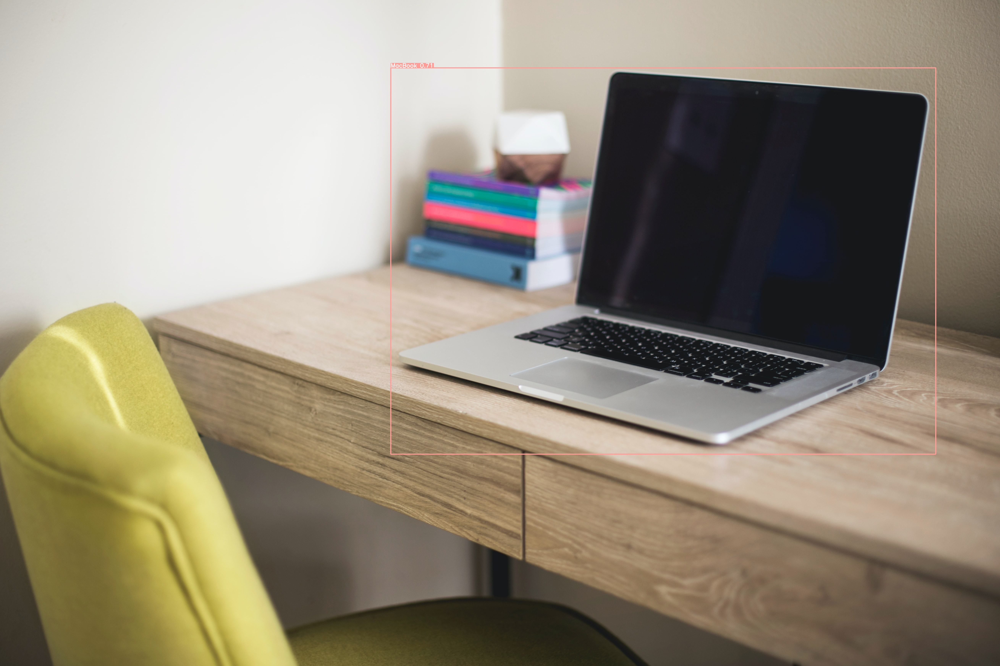

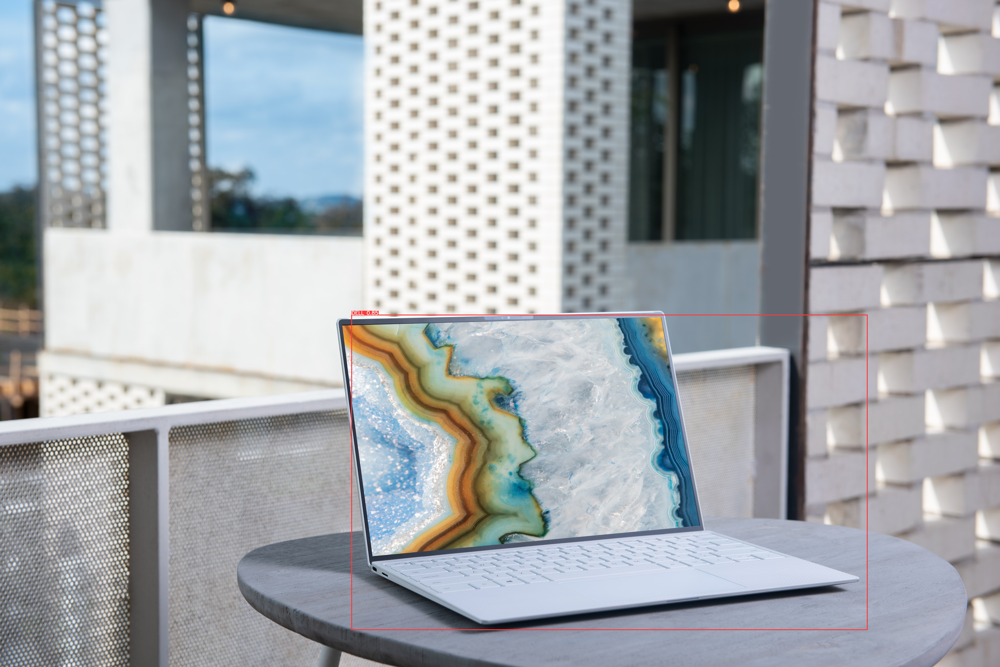

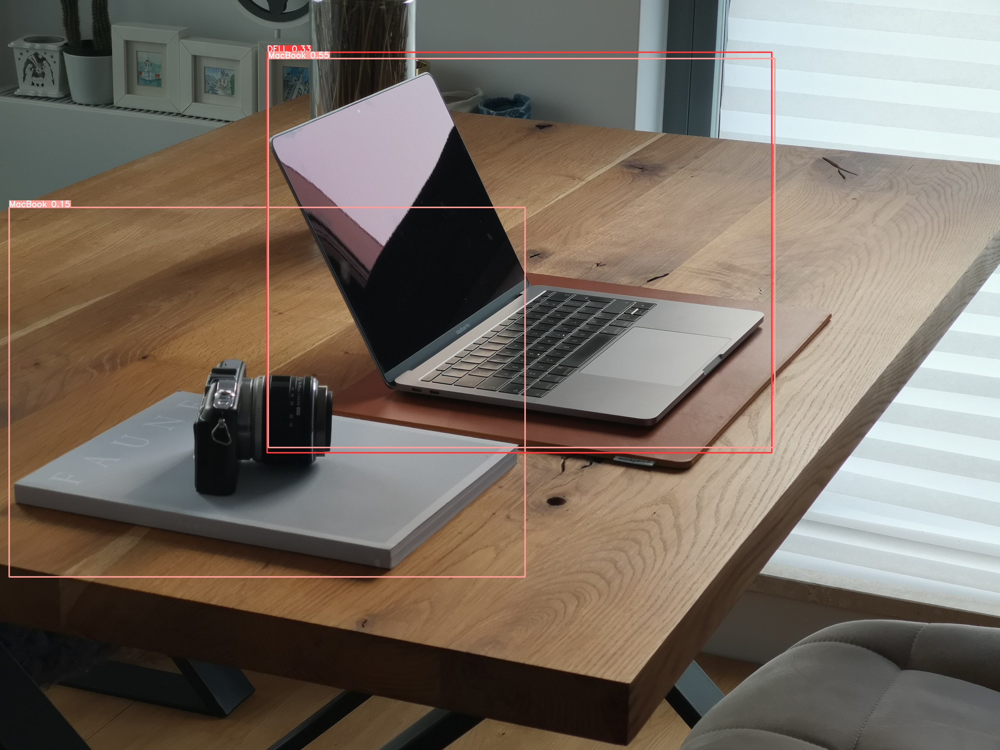

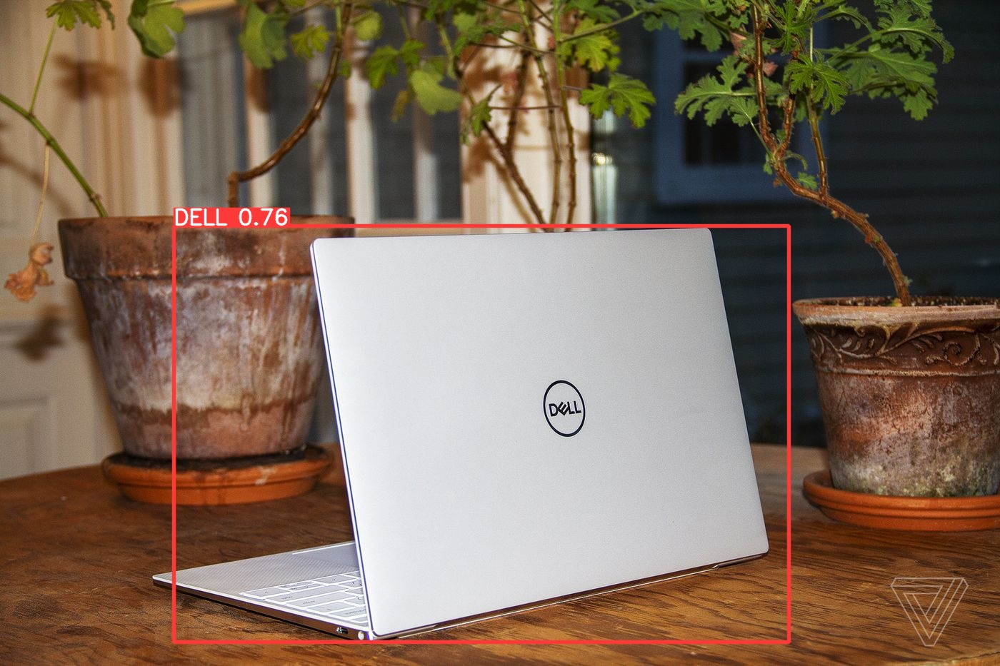

In [21]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): #assuming JPG
    display(Image(filename=imageName, width=1024, height=768))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).